In [1]:
#import necessary Python libraries
import pandas as pd
import folium
import datetime
import numpy as np
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt 

# read csv files
df1 = pd.read_csv('2020.csv') # the data is published on Kaggle  https://www.kaggle.com/datasets/onlyrohit/crimes-in-chicago
df2 = pd.read_csv('2021.csv')
df3 = pd.read_csv('2022.csv') 
pop = pd.read_excel('chicagopop.csv') # population of each community area on Wikipedia and the region they belong  https://en.wikipedia.org/wiki/Community_areas_in_Chicago

In [2]:
df1 = pd.concat([df1, df2], axis=0)  #concat all the dataframes of each year into 1 dataframe
df = pd.concat([df1, df3], axis=0)
 

#drop unecessary columns that we will not use
df = df.drop(columns=['Case Number','IUCR','Description', 'Beat', "District", "Ward", "FBI Code", "X Coordinate", "Y Coordinate", "Updated On",'Location'])
df = df.dropna()  #drop na values

In [3]:
pop.head(3)  #check that we can see the data

,Name,Population,Area
0,Rogers Park,55628,Far North Side
1,West Ridge,77122,Far North Side
2,Uptown,57182,Far North Side


In [4]:
df.head(3)

,ID,Date,Block,Primary Type,Location Description,Arrest,Domestic,Community Area,Year,Latitude,Longitude
0,12016034,01/01/2020 12:00:00 AM,018XX N WINNEBAGO AVE,DECEPTIVE PRACTICE,APARTMENT,False,False,22.0,2020,41.915306,-87.686639
1,12220321,01/01/2020 12:00:00 AM,091XX S DREXEL AVE,OFFENSE INVOLVING CHILDREN,RESIDENCE,False,True,47.0,2020,41.728192,-87.600985
2,12013828,01/01/2020 12:00:00 AM,044XX S LAVERGNE AVE,CRIMINAL SEXUAL ASSAULT,APARTMENT,False,False,56.0,2020,41.812274,-87.748177


In [5]:
#we observe that we can insert the community area number of each neighbourhood by reseting the index + 1 
pop = pop.reset_index()
pop.rename(columns={'index':'Community Area'}, inplace=True)

# increase the index of all rows by 1
pop['Community Area'] = pop['Community Area'] + 1

In [6]:
from datetime import datetime
# extract Hour from Date column and store it in new columns called 'Month','Hour'
df['Hour'] = df['Date'].apply(lambda x: datetime.strptime(x, '%m/%d/%Y %I:%M:%S %p').hour)

# extract month from Date column and store it in a new column called 'Month'
df['Month'] = df['Date'].apply(lambda x: datetime.strptime(x, '%m/%d/%Y %I:%M:%S %p').month)

In [7]:
df = pd.merge(df, pop, on='Community Area', how='inner') #merge with pop, so all the data is in df dataframe

In [8]:
df.head(3)

,ID,Date,Block,Primary Type,Location Description,Arrest,Domestic,Community Area,Year,Latitude,Longitude,Hour,Month,Name,Population,Area
0,12016034,01/01/2020 12:00:00 AM,018XX N WINNEBAGO AVE,DECEPTIVE PRACTICE,APARTMENT,False,False,22.0,2020,41.915306,-87.686639,0,1,Logan Square,71665,North Side
1,11950278,01/01/2020 12:01:00 AM,038XX W FULLERTON AVE,OTHER OFFENSE,RESIDENCE,False,True,22.0,2020,41.924536,-87.722407,0,1,Logan Square,71665,North Side
2,11939212,01/01/2020 01:20:00 AM,020XX N CALIFORNIA AVE,CRIMINAL DAMAGE,CONVENIENCE STORE,True,False,22.0,2020,41.917654,-87.697205,1,1,Logan Square,71665,North Side


In [9]:
df.groupby(["Year"])["Primary Type"].count().mean() #average number of crimes per year

209063.66666666666

In [10]:
df.groupby(["Year","Month"])["Primary Type"].count().mean()  #average number of crimes per month

17421.972222222223

[Text(0, 0, 'THEFT'),
 Text(1, 0, 'BATTERY'),
 Text(2, 0, 'CRIMINAL DAMAGE'),
 Text(3, 0, 'ASSAULT'),
 Text(4, 0, 'DECEPTIVE PRACTICE'),
 Text(5, 0, 'MOTOR VEHICLE THEFT'),
 Text(6, 0, 'OTHER OFFENSE'),
 Text(7, 0, 'WEAPONS VIOLATION'),
 Text(8, 0, 'ROBBERY'),
 Text(9, 0, 'BURGLARY'),
 Text(10, 0, 'NARCOTICS'),
 Text(11, 0, 'CRIMINAL TRESPASS'),
 Text(12, 0, 'OFFENSE INVOLVING CHILDREN'),
 Text(13, 0, 'CRIMINAL SEXUAL ASSAULT'),
 Text(14, 0, 'SEX OFFENSE'),
 Text(15, 0, 'PUBLIC PEACE VIOLATION'),
 Text(16, 0, 'HOMICIDE'),
 Text(17, 0, 'ARSON'),
 Text(18, 0, 'INTERFERENCE WITH PUBLIC OFFICER'),
 Text(19, 0, 'STALKING'),
 Text(20, 0, 'PROSTITUTION'),
 Text(21, 0, 'LIQUOR LAW VIOLATION'),
 Text(22, 0, 'CONCEALED CARRY LICENSE VIOLATION'),
 Text(23, 0, 'INTIMIDATION'),
 Text(24, 0, 'KIDNAPPING'),
 Text(25, 0, 'OBSCENITY'),
 Text(26, 0, 'CRIM SEXUAL ASSAULT'),
 Text(27, 0, 'GAMBLING'),
 Text(28, 0, 'HUMAN TRAFFICKING'),
 Text(29, 0, 'PUBLIC INDECENCY'),
 Text(30, 0, 'OTHER NARCOTIC VIOLATIO

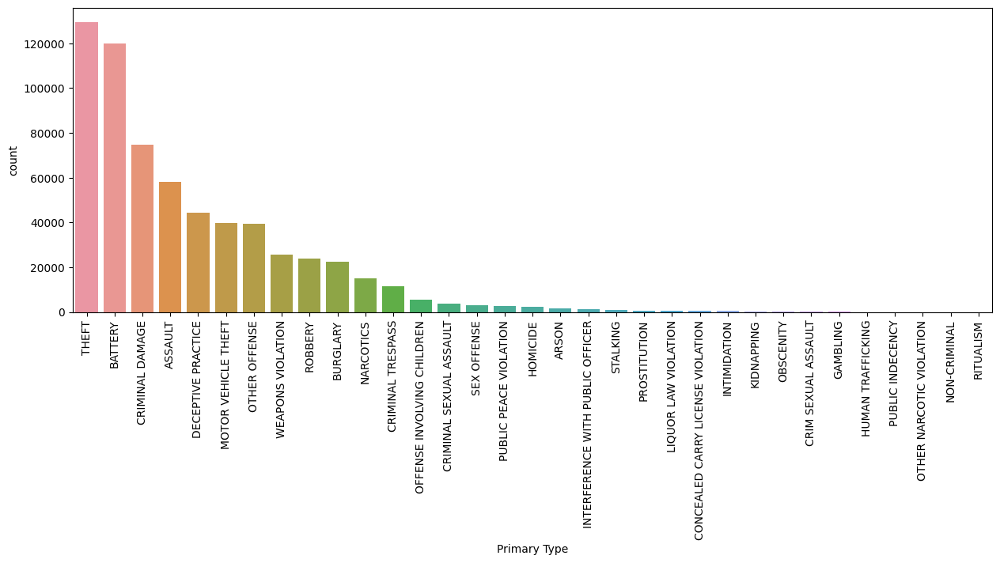

In [11]:
#Now that we have everything in a dataframe, we can start visualizations
# First, we can print the value counts of the categories
plt.figure(figsize=(15,5))
ax = sns.countplot(x = df['Primary Type'], orient='v', order = df['Primary Type'].value_counts().index)
ax.set_xticklabels(ax.get_xticklabels(),rotation = 90)

In [12]:
import plotly.express as px
# 4.2 Create a Crime Map of Chicago using Plotly
# Limit the data to a fraction 0.04
df_filtered = df.sample(frac=0.04) 
fig = px.scatter_mapbox(df_filtered, lat="Latitude", lon="Longitude", hover_name="Primary Type", color='Primary Type', hover_data=["Location Description", "Area" ,"Name","Arrest"], zoom=12, height=800)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

<Figure size 1600x1000 with 0 Axes>

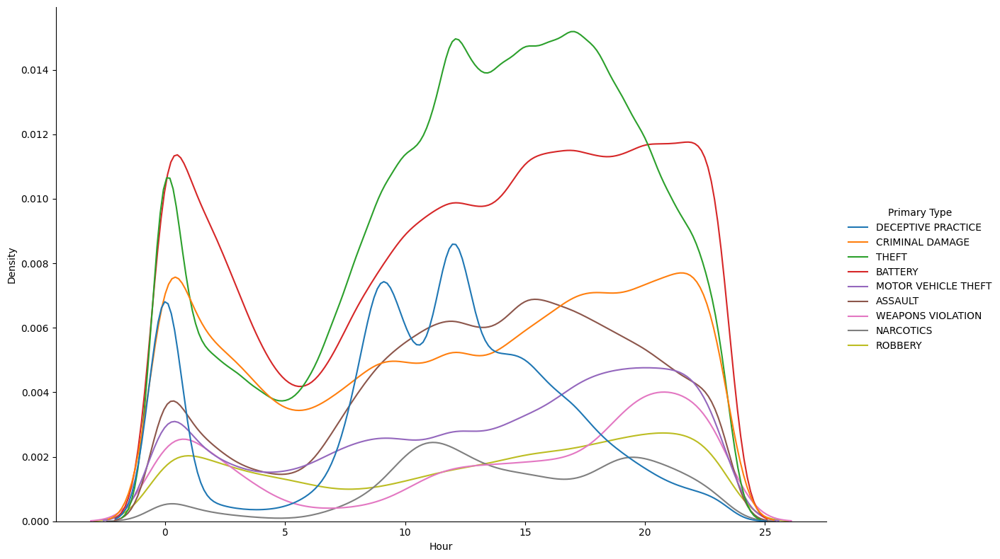

In [13]:
#and now with these types we can use them to print the density between hour and these types of crime
commontypes = df[df['Primary Type'].isin([
    'THEFT', 
    'BATTERY', 
    'CRIMINAL DAMAGE', 
    'ASSAULT', 
    'DECEPTIVE PRACTICE', 
    'MOTOR VEHICLE THEFT', 
    'WEAPONS VIOLATION',
    'ROBBERY',
    'NARCOTICS'])]

plt.figure(figsize=(16,10))
ax = sns.displot(x = 'Hour', hue="Primary Type", data = commontypes, kind="kde", height=8, aspect=1.5)

In [14]:
df_area = df['Area'].value_counts().reset_index().rename(columns={'index':'Area','Area':'Number of crimes'})

fig = px.bar(df_area, x='Area', y='Number of crimes', title='Count of crimes in each area')
fig.update_layout(xaxis_title = 'Area', yaxis_title = 'Number of crimes')
fig.show()

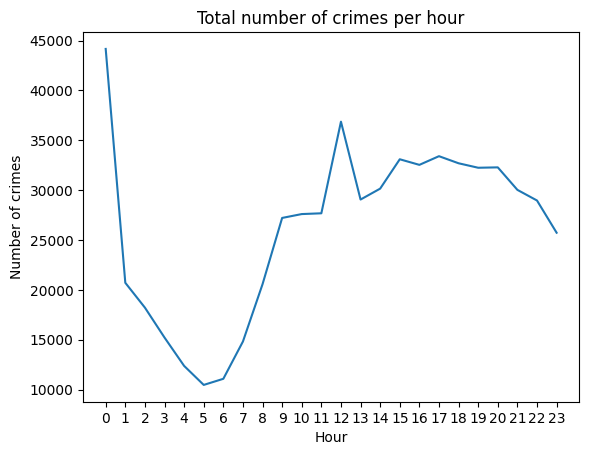

In [15]:
crimes_per_hour = df.groupby("Hour")["Primary Type"].count()

# Plot the total number of crimes per hour
ax = crimes_per_hour.plot(kind='line')

# Set the x-tick labels to show all 24 hours of the day
ax.set_xticks(range(24))
plt.xlabel("Hour")
plt.ylabel("Number of crimes")
plt.title("Total number of crimes per hour")
plt.show()

In [16]:
twelve = df[df['Hour'] == 0]
df_twelve = twelve['Location Description'].value_counts().reset_index().rename(columns={'index':'Location Description','Location Description':'Number of crimes'}).head(10)

fig = px.bar(df_twelve, x='Location Description', y='Number of crimes', title='Number of crimes in each location around 00:00' )
fig.update_layout(xaxis_title = 'Location', yaxis_title = 'Number of crimes')
fig.show()